# Introduction

Taking Inspiration from this kaggle notebook https://www.kaggle.com/michalisz/ken-jee-youtube-metrics-eda I have tried to recreate the plots in plotly python.

**About Ken Jee**

Ken Jee is a data scientist and a youtuber who is working in the data science industry from the last 5 years. He has held data science positions in companies ranging from startups to fortune 100 organizations. He transitioned into data science from a business and consulting background. When he was first starting out on my data science journey he was extremely lost; there were very few resources for him to learn about this field from. He decided to start making YouTube videos to share his experiences and to hopefully help others get break into the data science and sports analytics fields.

In this project Ken has provided his YouTube channel data directly from the YouTube API as his first community project.

# Importing Libraries And Loading The Data

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # for plotting the data 
import seaborn as sns # Advanced data plotting on top of matplotlib
import os
from pathlib import Path
import datatable as dt
import plotly.express as px

%matplotlib inline
from plotly.offline import init_notebook_mode, iplot 
import plotly.graph_objs as go
import plotly.offline as py
py.init_notebook_mode(connected=True)
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator, ImageColorGenerator
%matplotlib inline

In [2]:
country_metrics = pd.read_csv("../input/ken-jee-youtube-data/Aggregated_Metrics_By_Country_And_Subscriber_Status.csv")
video_metrics = pd.read_csv("../input/ken-jee-youtube-data/Aggregated_Metrics_By_Video.csv")
comments = pd.read_csv("../input/ken-jee-youtube-data/All_Comments_Final.csv")
video_perf = pd.read_csv("../input/ken-jee-youtube-data/Video_Performance_Over_Time.csv")

There are 4 different CSV files. We will analyze each file separately

# Aggregated Metrics By Video

From the data discription

Aggregated Metrics By Video - This has all the topline metrics from my channel from its start (around 2015 to Jan 22 2022). I didn't post my first video until around

In [3]:
video_metrics.head()

,Video,Video title,Video pub­lish time,Com­ments ad­ded,Shares,Dis­likes,Likes,Sub­scribers lost,Sub­scribers gained,RPM (USD),CPM (USD),Av­er­age per­cent­age viewed (%),Av­er­age view dur­a­tion,Views,Watch time (hours),Sub­scribers,Your es­tim­ated rev­en­ue (USD),Im­pres­sions,Im­pres­sions click-through rate (%)
0,Total,NaN,NaN,14197,39640,3902,225021,45790,229241,5.276,11.990,26.61,0:03:25,5568487,317602.3536,183451,29068.652,100954064,3.16
1,4OZip0cgOho,How I Would Learn Data Science (If I Had to St...,"May 8, 2020",907,9583,942,46903,451,46904,6.353,12.835,36.65,0:03:09,1253559,65850.7042,46453,7959.533,26498799,3.14
2,78LjdAAw0wA,100K Channel Update + AMA Stream!,"Nov 12, 2020",412,4,4,130,15,12,2.668,6.259,6.26,0:05:14,2291,200.2966,-3,6.113,188318,0.72
3,hO_YKK_0Qck,Uber Driver to Machine Learning Engineer in 9 ...,"Jul 16, 2020",402,152,15,881,9,198,9.516,11.695,15.12,0:10:21,21350,3687.3387,189,202.963,442334,2.53
4,uXLnbdHMf8w,Why I'm Starting Data Science Over Again.,"Aug 29, 2020",375,367,22,2622,40,1957,3.143,7.943,33.41,0:02:36,49564,2148.3110,1917,155.779,521185,4.01


In [4]:
video_metrics.shape

(224, 19)

In [5]:
video_metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 224 entries, 0 to 223
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Video                                 224 non-null    object 
 1   Video title                           223 non-null    object 
 2   Video pub­lish time                   223 non-null    object 
 3   Com­ments ad­ded                      224 non-null    int64  
 4   Shares                                224 non-null    int64  
 5   Dis­likes                             224 non-null    int64  
 6   Likes                                 224 non-null    int64  
 7   Sub­scribers lost                     224 non-null    int64  
 8   Sub­scribers gained                   224 non-null    int64  
 9   RPM (USD)                             224 non-null    float64
 10  CPM (USD)                             222 non-null    float64
 11  Av­er­age per­cent­

The data contains 224 Rows and 19 Columns. We can see that first row is summarized as `Total`. Hence there is one missing value in `Video title` and `Video publish time`

In [6]:
total_vid_metrics =  video_metrics[:1]

In [7]:
total_vid_metrics

,Video,Video title,Video pub­lish time,Com­ments ad­ded,Shares,Dis­likes,Likes,Sub­scribers lost,Sub­scribers gained,RPM (USD),CPM (USD),Av­er­age per­cent­age viewed (%),Av­er­age view dur­a­tion,Views,Watch time (hours),Sub­scribers,Your es­tim­ated rev­en­ue (USD),Im­pres­sions,Im­pres­sions click-through rate (%)
0,Total,NaN,NaN,14197,39640,3902,225021,45790,229241,5.276,11.99,26.61,0:03:25,5568487,317602.3536,183451,29068.652,100954064,3.16


We will drop the first row.

In [8]:
video_metrics = video_metrics.drop(video_metrics.index[:1])

Let's Check Missing Values

In [9]:
video_metrics.isnull().sum()

Video                                   0
Video title                             0
Video pub­lish time                     0
Com­ments ad­ded                        0
Shares                                  0
Dis­likes                               0
Likes                                   0
Sub­scribers lost                       0
Sub­scribers gained                     0
RPM (USD)                               0
CPM (USD)                               2
Av­er­age per­cent­age viewed (%)       0
Av­er­age view dur­a­tion               0
Views                                   0
Watch time (hours)                      0
Sub­scribers                            0
Your es­tim­ated rev­en­ue (USD)        0
Im­pres­sions                           0
Im­pres­sions click-through rate (%)    0
dtype: int64

There are 2 missing vlaues in CRM variable. We will replace it by 0.

- We will convert Video publish time feature to appropriate Date data type from character

- We will fix the date from Video Publish time and break it also down into new features of Year and Month

In [10]:
# transform to Date data type
video_metrics['Video pub­lish time']=pd.to_datetime(video_metrics['Video pub­lish time'])

In [11]:
video_metrics['Year'] = video_metrics['Video pub­lish time'].dt.year
video_metrics['Month'] = video_metrics['Video pub­lish time'].dt.month

Lets, see the Correlation Metrics and check the correaltion between variables

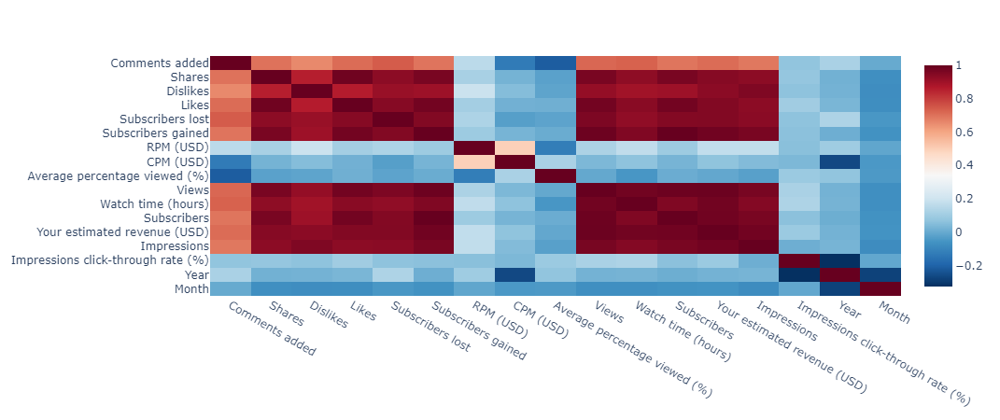

In [12]:
corre = video_metrics.corr()
fig = px.imshow(corre, text_auto=False, aspect="auto", color_continuous_scale='RdBu_r')
fig.show()

There is a strong correlation between certain variables

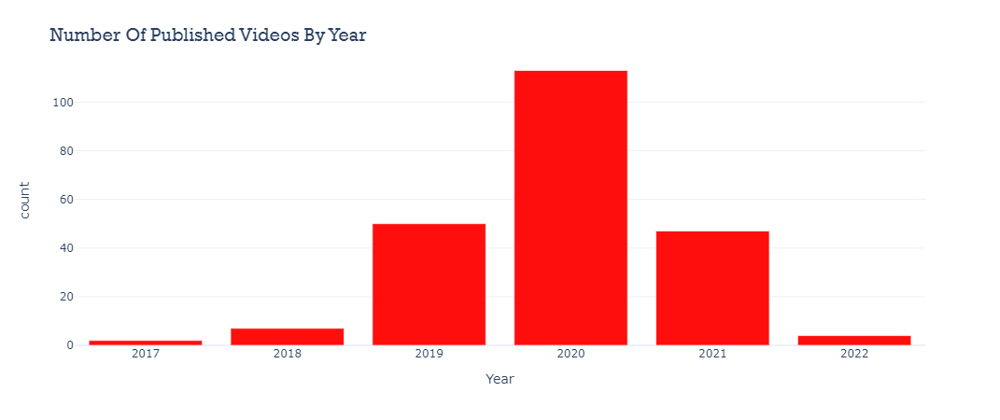

In [13]:
temp = pd.DataFrame(video_metrics['Year'].value_counts().sort_values(ascending = True))
temp.columns = ['count'] # `count` is like a keyword name for the feature here
temp['Year'] = temp.index


plt_title = 'Number Of Published Videos By Year'

fig = px.bar(temp, x = 'Year', y = 'count')
fig.update_traces(marker_color='rgb(255,14,14)')
# template enhancement
fig.update_layout(
    template="plotly_white",
    title={
        "text": plt_title,
        "font": {"family": "Rockwell", "size": 20},
        "yanchor": "top",
    }
)
fig.show()

The number of Videos published in year 2020 is highest with 113 videos followed by 2021 which has 47 published videos.

# Distributions

Let's Check Distribustions from Video Metrics 

In [14]:
def hist_plotter(df, feat, plt_title):
    
   
   
    fig = px.histogram(df, x=feat)
   
    
    # template enhancement
    fig.update_traces(marker_color='rgb(255,14,14)')    
    fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        },
        xaxis_title = feat,
        yaxis_title = "Count"
    )
    
    return fig.show()
    

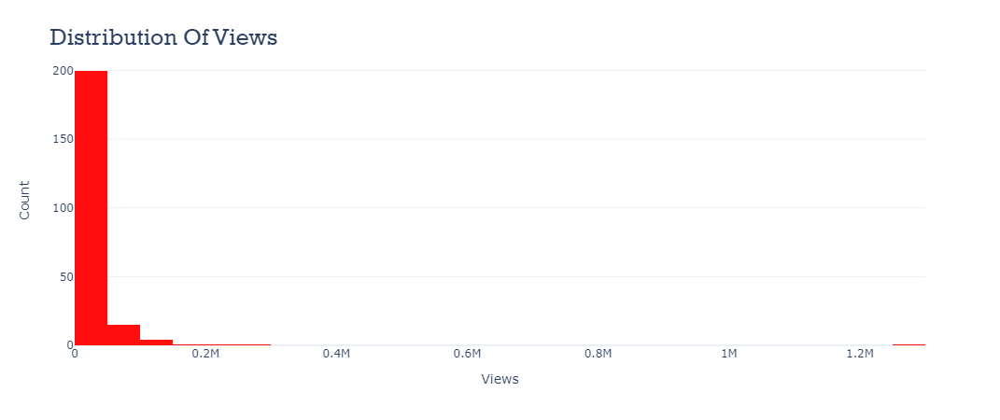

In [15]:
hist_plotter(video_metrics,"Views", "Distribution Of Views")

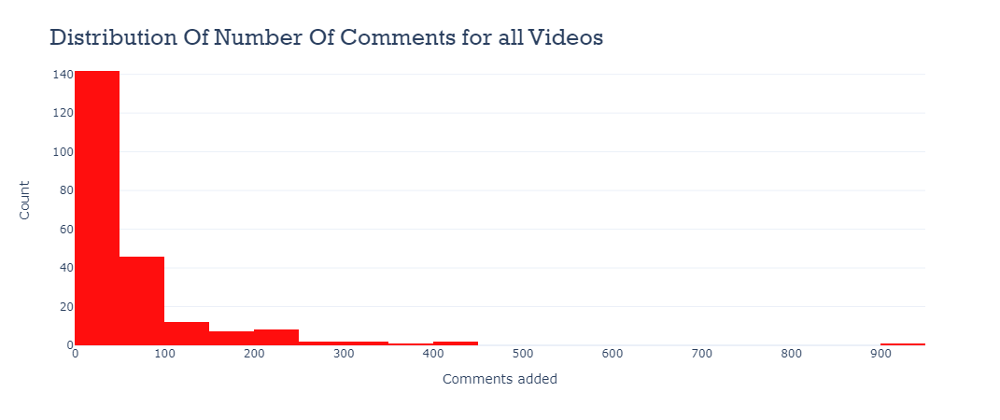

In [16]:
hist_plotter(video_metrics,"Com­ments ad­ded", "Distribution Of Number Of Comments for all Videos")

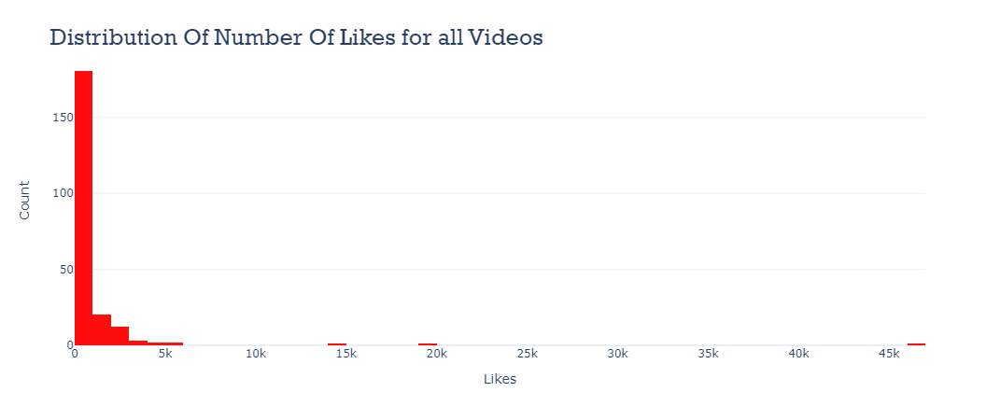

In [17]:
hist_plotter(video_metrics,"Likes", "Distribution Of Number Of Likes for all Videos")

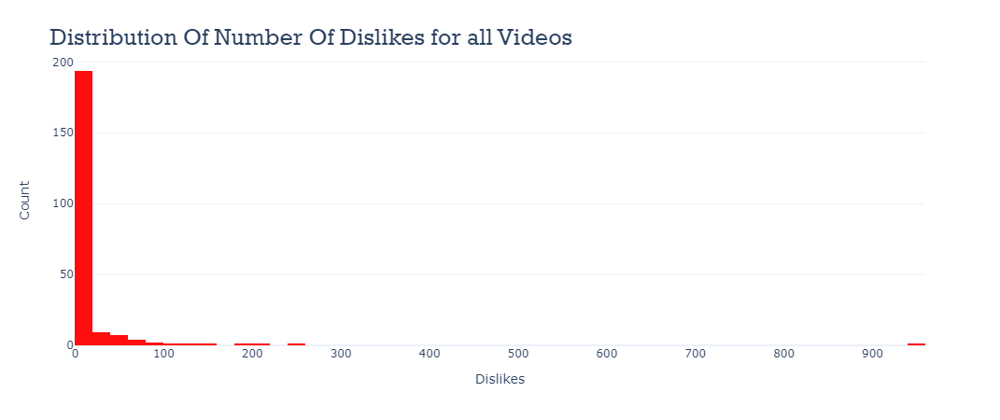

In [18]:
hist_plotter(video_metrics,"Dis­likes", "Distribution Of Number Of Dislikes for all Videos")

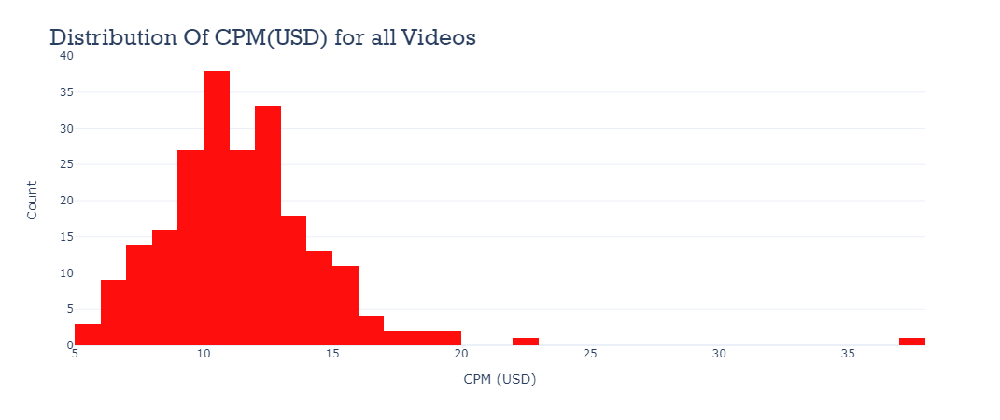

In [19]:
hist_plotter(video_metrics,"CPM (USD)", "Distribution Of CPM(USD) for all Videos")

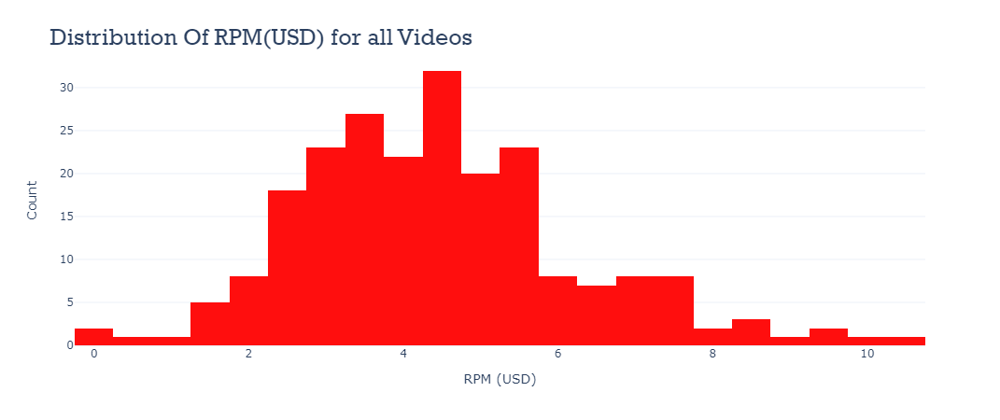

In [20]:
hist_plotter(video_metrics,"RPM (USD)", "Distribution Of RPM(USD) for all Videos")

We can see that most of Kens videos generate an RPM (USD) close to 5 USD.

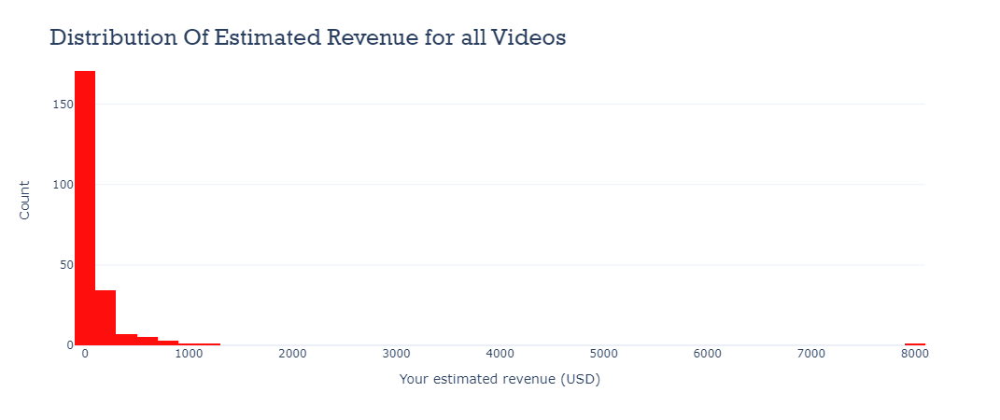

In [21]:
hist_plotter(video_metrics,"Your es­tim­ated rev­en­ue (USD)", "Distribution Of Estimated Revenue for all Videos")

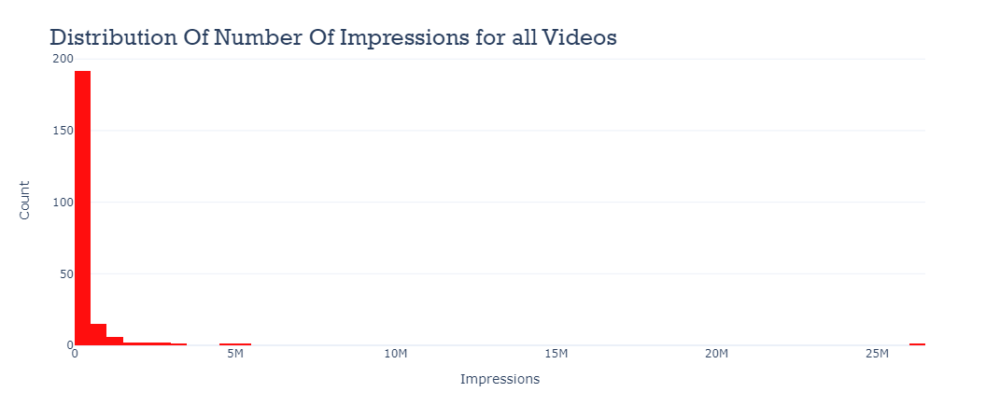

In [22]:
hist_plotter(video_metrics,"Im­pres­sions", "Distribution Of Number Of Impressions for all Videos")

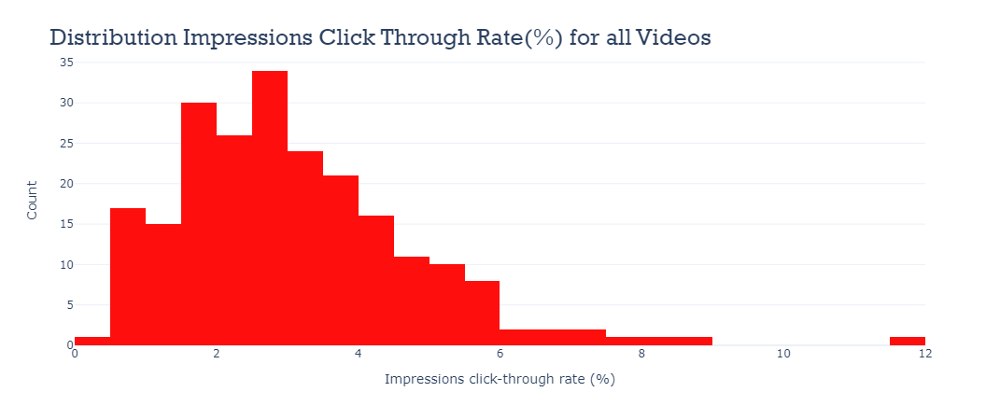

In [23]:
hist_plotter(video_metrics,"Im­pres­sions click-through rate (%)", "Distribution Impressions Click Through Rate(%) for all Videos")

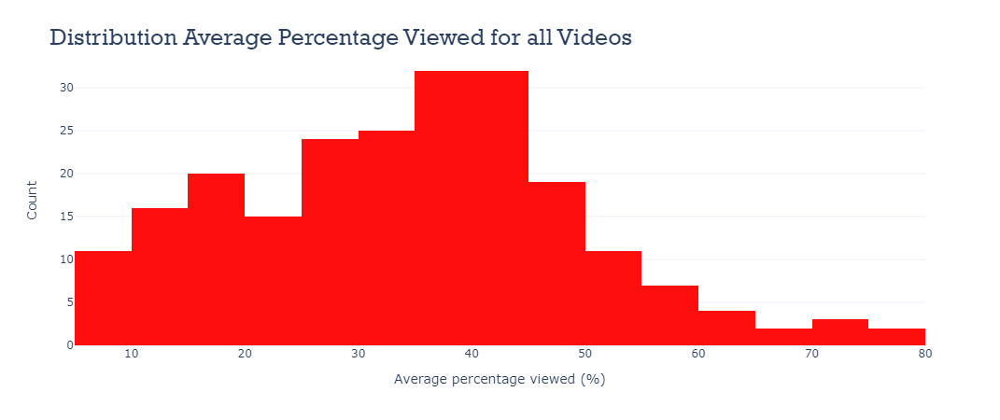

In [24]:
hist_plotter(video_metrics,"Av­er­age per­cent­age viewed (%)", "Distribution Average Percentage Viewed for all Videos")

# Top 10 Videos

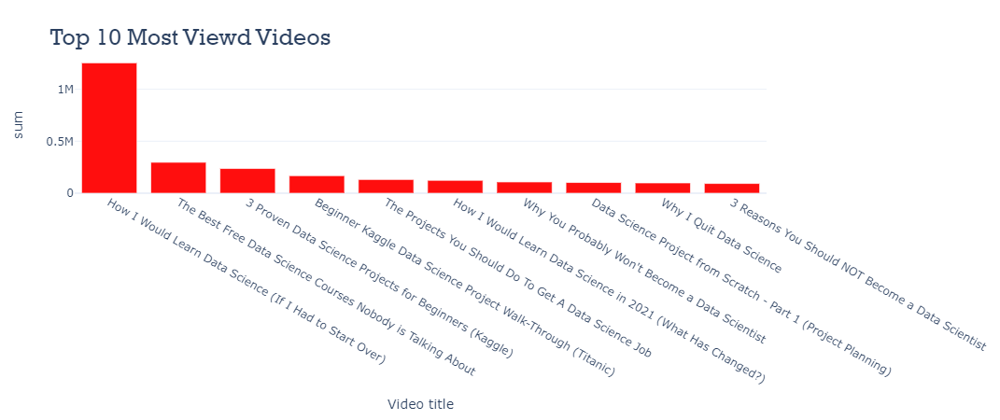

In [25]:
df = video_metrics.groupby('Video title')['Views'].agg(['sum']).sort_values(by = 'sum', ascending=False).reset_index().head(10)
fig = px.bar( df, x='Video title',y = 'sum')

plt_title = "Top 10 Most Viewd Videos"

fig.update_traces(marker_color='rgb(255,14,14)')    
fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        })

fig.show()   

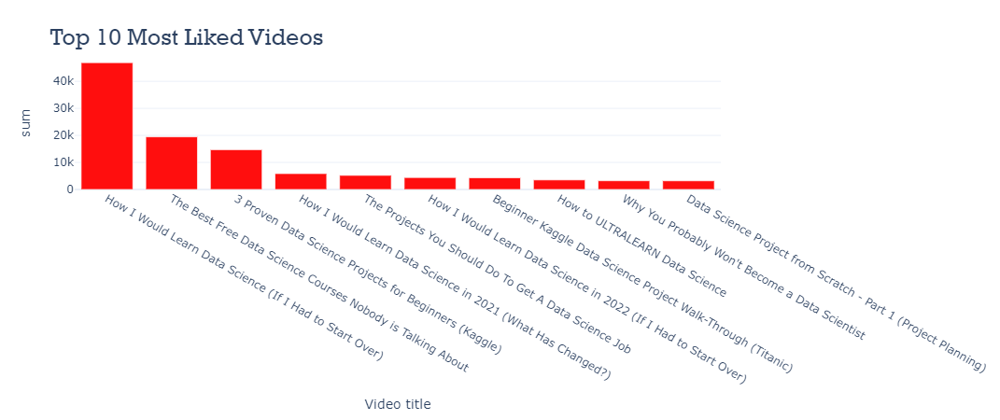

In [26]:
df = video_metrics.groupby('Video title')['Likes'].agg(['sum']).sort_values(by = 'sum', ascending=False).reset_index().head(10)
fig = px.bar( df, x='Video title',y = 'sum')

plt_title = "Top 10 Most Liked Videos"

fig.update_traces(marker_color='rgb(255,14,14)')    
fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        }
        
    )
fig.show()

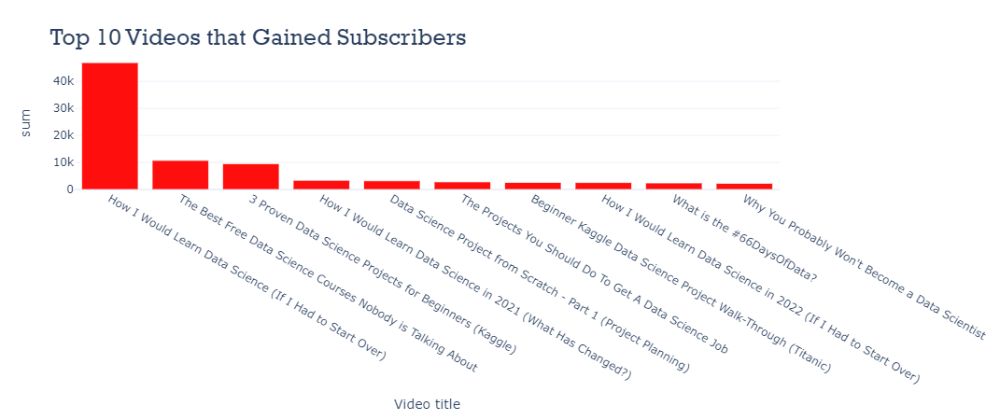

In [27]:
df = video_metrics.groupby('Video title')['Sub­scribers gained'].agg(['sum']).sort_values(by = 'sum', ascending=False).reset_index().head(10)
fig = px.bar( df, x='Video title',y = 'sum')

plt_title = "Top 10 Videos that Gained Subscribers"

fig.update_traces(marker_color='rgb(255,14,14)')    
fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        }
        
    )
fig.show()

The video *How I would Learn Data Science (if I Had to Start Over) is by far the most Viewed video of the channel and has also close to ~ 47k likes.

## Wordcloud of titles

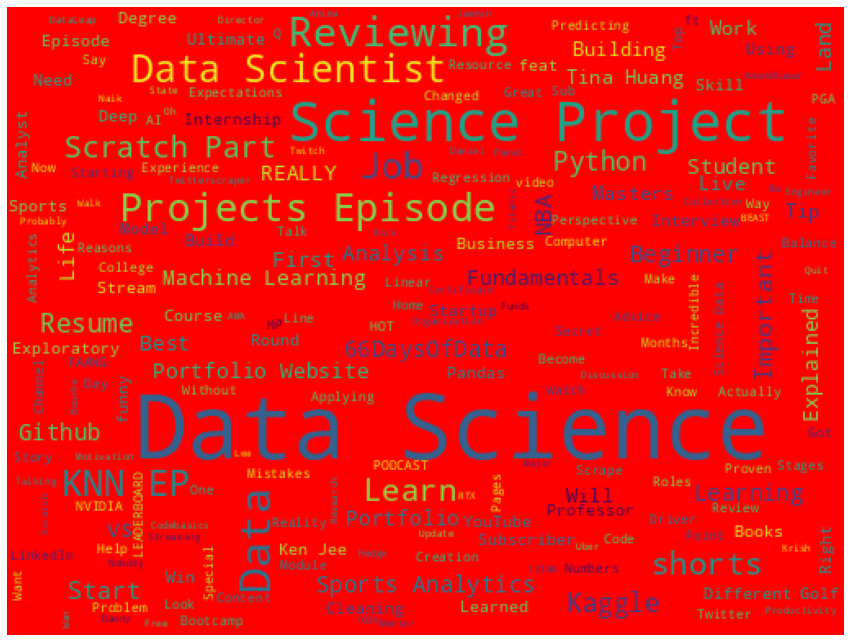

In [28]:
words = video_metrics['Video title']
plt.subplots(figsize = (15,15))

wordcloud = WordCloud (
                    background_color = 'red',
                    width = 512,
                    height = 384
                        ).generate(' '.join(words))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.savefig('Plotly-World_Cloud.png')
plt.show()

Ken has a lot of Videos related with the topic of data science projects

Reviewing portfolios and resumes

KNN podcast episodes

Data sceince Job 

NBA sport analytics

And all other topics related to data science like github, pyhton, machine learning, 66 Days of Data, kaggle etc.

# Aggregated Metrics by Country

From the data discription

Aggregated Metrics By Video with Country and Subscriber Status - This has the same data as aggregated metrics by video, but it includes dimensions for which country people are viewing from and if the viewers are subscribed to the channel or not.

In [29]:
country_metrics.head()

,Video Title,External Video ID,Video Length,Thumbnail link,Country Code,Is Subscribed,Views,Video Likes Added,Video Dislikes Added,Video Likes Removed,User Subscriptions Added,User Subscriptions Removed,Average View Percentage,Average Watch Time,User Comments Added
0,🌶 Hot Topics in Tech: Data Science Explained #...,OtqQYqRNDGI,59,https://i.ytimg.com/vi/OtqQYqRNDGI/hqdefault.jpg,HK,True,23,1,0,0,2,0,0.671870,39.640348,0
1,🌶 Hot Topics in Tech: Data Science Explained #...,OtqQYqRNDGI,59,https://i.ytimg.com/vi/OtqQYqRNDGI/hqdefault.jpg,ME,True,3,0,0,0,0,0,0.498870,29.433333,0
2,🌶 Hot Topics in Tech: Data Science Explained #...,OtqQYqRNDGI,59,https://i.ytimg.com/vi/OtqQYqRNDGI/hqdefault.jpg,RW,True,2,0,0,0,0,0,0.681780,40.225000,0
3,🌶 Hot Topics in Tech: Data Science Explained #...,OtqQYqRNDGI,59,https://i.ytimg.com/vi/OtqQYqRNDGI/hqdefault.jpg,US,True,979,81,6,8,16,4,0.694854,40.996389,0
4,🌶 Hot Topics in Tech: Data Science Explained #...,OtqQYqRNDGI,59,https://i.ytimg.com/vi/OtqQYqRNDGI/hqdefault.jpg,DE,False,75,3,0,1,0,0,0.661515,39.029373,0


In [30]:
country_metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55292 entries, 0 to 55291
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Video Title                 55292 non-null  object 
 1   External Video ID           55292 non-null  object 
 2   Video Length                55292 non-null  int64  
 3   Thumbnail link              55292 non-null  object 
 4   Country Code                54906 non-null  object 
 5   Is Subscribed               55292 non-null  bool   
 6   Views                       55292 non-null  int64  
 7   Video Likes Added           55292 non-null  int64  
 8   Video Dislikes Added        55292 non-null  int64  
 9   Video Likes Removed         55292 non-null  int64  
 10  User Subscriptions Added    55292 non-null  int64  
 11  User Subscriptions Removed  55292 non-null  int64  
 12  Average View Percentage     53854 non-null  float64
 13  Average Watch Time          538

In [31]:
country_metrics.isnull().sum()

Video Title                      0
External Video ID                0
Video Length                     0
Thumbnail link                   0
Country Code                   386
Is Subscribed                    0
Views                            0
Video Likes Added                0
Video Dislikes Added             0
Video Likes Removed              0
User Subscriptions Added         0
User Subscriptions Removed       0
Average View Percentage       1438
Average Watch Time            1438
User Comments Added              0
dtype: int64

## Performance Of Top 10 Videos in India 

In [32]:
country_metrics['Video Length'] = country_metrics['Video Length']/60

In [33]:
country_metrics['Average Watch Time'] = country_metrics['Average Watch Time']/60

In [34]:
top = country_metrics[country_metrics['Country Code'] == 'IN'].sort_values(by='Views',ascending=False).head(10)
       
z = top[['Video Title','Video Length','Average Watch Time','Average View Percentage','Video Likes Added']]
#z.style.set_properties(**{'background-color': 'pink',
                            #'color': 'black',
                            #'border-color': 'white'})
z.style.background_gradient(cmap='Reds') 

,Video Title,Video Length,Average Watch Time,Average View Percentage,Video Likes Added
35664,How I Would Learn Data Science (If I Had to Start Over),8.600000,2.783660,0.323681,8442
12331,The Best Free Data Science Courses Nobody is Talking About,6.250000,1.911307,0.305809,4386
54254,3 Proven Data Science Projects for Beginners (Kaggle),7.566667,2.409939,0.318494,2629
49732,Beginner Kaggle Data Science Project Walk-Through (Titanic),38.266667,4.750868,0.124152,569
10520,The Projects You Should Do To Get A Data Science Job,12.833333,2.306984,0.179765,770
44414,Data Science Project from Scratch - Part 1 (Project Planning),7.466667,1.957934,0.262223,473
35535,How I Would Learn Data Science (If I Had to Start Over),8.600000,2.610553,0.303553,1481
27610,Is Data Science Dying?,9.150000,2.417983,0.264260,527
12404,The Best Free Data Science Courses Nobody is Talking About,6.250000,2.051420,0.328227,1723
53845,3 Reasons You Should NOT Become a Data Scientist,6.216667,2.261152,0.363724,399


In [35]:
country_metrics.dropna(subset = ['Country Code'], how = 'all', inplace=True)

In [36]:
country_metrics.drop_duplicates(subset=None, keep='first', inplace=True)

In [37]:
country_metrics.isnull().sum()

Video Title                      0
External Video ID                0
Video Length                     0
Thumbnail link                   0
Country Code                     0
Is Subscribed                    0
Views                            0
Video Likes Added                0
Video Dislikes Added             0
Video Likes Removed              0
User Subscriptions Added         0
User Subscriptions Removed       0
Average View Percentage       1248
Average Watch Time            1248
User Comments Added              0
dtype: int64

In [38]:
country_metrics['Country Code'].nunique()

233

In [39]:
country_metrics.shape

(54906, 15)

In [40]:
df = country_metrics.groupby('Country Code')['Views'].agg(['sum']).sort_values(by = 'sum', ascending=False).reset_index()
df.head()

,Country Code,sum
0,US,1354450
1,IN,1155510
2,GB,239177
3,CA,222373
4,DE,172165


We will convert the country code to country name.

In [41]:
pip install country_converter

     |████████████████████████████████| 51 kB 714 kB/s            
  Preparing metadata (setup.py) ... done
  Created wheel for country-converter: filename=country_converter-0.7.7-py3-none-any.whl size=53788 sha256=c9c527e76f5abd18d171d590db682e9c780b123f3f65a0b9c7f5290e391b169b
  Stored in directory: /root/.cache/pip/wheels/e8/e6/60/61798a8a91462250002293d1c8cc8de90a130119a813277ccc
Successfully built country-converter
Note: you may need to restart the kernel to use updated packages.


In [42]:
import country_converter as coco

df['short name'] = df['Country Code'].apply(lambda x: coco.convert(names=x, to='name_short', not_found=None))

In [43]:
for col in df.columns:
    df[col] = df[col].astype(str)

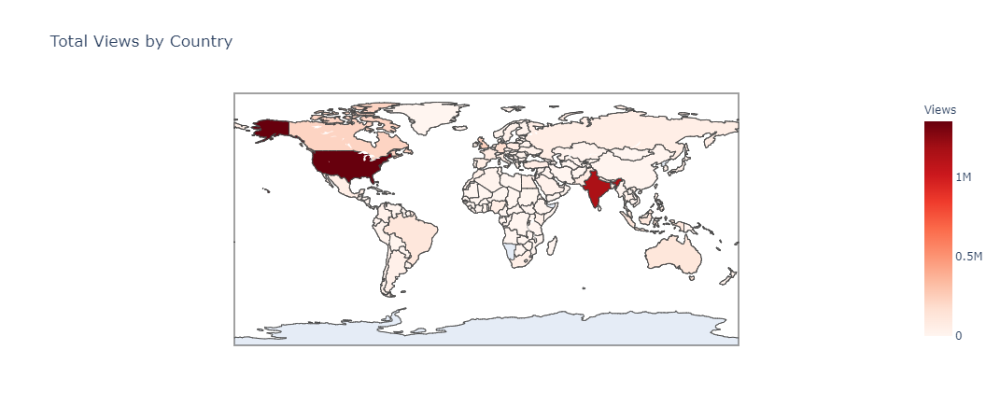

In [44]:
fig = go.Figure(data=go.Choropleth(
    locations=df['short name'], # Spatial coordinates
    z = df['sum'].astype(float), # Data to be color-coded
    locationmode = 'country names', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Views",
))
fig.update_layout(
    title_text = 'Total Views by Country'
   
)

fig.show()

We can see that top countries contributing to the views are,

- United States of America (1.354.450)

- India (1.155.510)
million total views.

# Video Performance Over Time

From the description we have:

Video Performance Over Time - This has the daily data from each of the videos.

In [45]:
video_perf.head()

,Date,Video Title,External Video ID,Video Length,Thumbnail link,Views,Video Likes Added,Video Dislikes Added,Video Likes Removed,User Subscriptions Added,User Subscriptions Removed,Average View Percentage,Average Watch Time,User Comments Added
0,19 Jan 2022,Kaggle Project From Scratch - Part 2 (Explorat...,KQ80oD_boBM,2191,https://i.ytimg.com/vi/KQ80oD_boBM/hqdefault.jpg,13,0,0,0,0,0,0.069055,151.300154,0
1,19 Jan 2022,Welcome To My Channel | Ken Jee | Data Science,smeFkHwnM_k,51,https://i.ytimg.com/vi/smeFkHwnM_k/hqdefault.jpg,2,0,0,0,1,0,0.471255,24.034000,0
2,19 Jan 2022,How She Dominated the FAANG Data Science Inter...,vfV4nm004VQ,2686,https://i.ytimg.com/vi/vfV4nm004VQ/hqdefault.jpg,10,0,0,0,0,0,0.126049,338.567500,0
3,19 Jan 2022,The 9 Books That Changed My Perspective in 2019,3TrAYmrmA8o,980,https://i.ytimg.com/vi/3TrAYmrmA8o/hqdefault.jpg,1,0,0,0,0,0,0.011508,11.278000,0
4,19 Jan 2022,Interview with the Director of AI Research @ N...,Xgg7dIKys9E,2904,https://i.ytimg.com/vi/Xgg7dIKys9E/hqdefault.jpg,1,0,0,0,0,0,0.007541,21.900000,0


In [46]:
video_perf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111857 entries, 0 to 111856
Data columns (total 14 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Date                        111857 non-null  object 
 1   Video Title                 111857 non-null  object 
 2   External Video ID           111857 non-null  object 
 3   Video Length                111857 non-null  int64  
 4   Thumbnail link              111857 non-null  object 
 5   Views                       111857 non-null  int64  
 6   Video Likes Added           111857 non-null  int64  
 7   Video Dislikes Added        111857 non-null  int64  
 8   Video Likes Removed         111857 non-null  int64  
 9   User Subscriptions Added    111857 non-null  int64  
 10  User Subscriptions Removed  111857 non-null  int64  
 11  Average View Percentage     110510 non-null  float64
 12  Average Watch Time          110510 non-null  float64
 13  User Comments 

In [47]:
video_perf['Date']=pd.to_datetime(video_perf['Date'])
video_perf.head()

,Date,Video Title,External Video ID,Video Length,Thumbnail link,Views,Video Likes Added,Video Dislikes Added,Video Likes Removed,User Subscriptions Added,User Subscriptions Removed,Average View Percentage,Average Watch Time,User Comments Added
0,2022-01-19,Kaggle Project From Scratch - Part 2 (Explorat...,KQ80oD_boBM,2191,https://i.ytimg.com/vi/KQ80oD_boBM/hqdefault.jpg,13,0,0,0,0,0,0.069055,151.300154,0
1,2022-01-19,Welcome To My Channel | Ken Jee | Data Science,smeFkHwnM_k,51,https://i.ytimg.com/vi/smeFkHwnM_k/hqdefault.jpg,2,0,0,0,1,0,0.471255,24.034000,0
2,2022-01-19,How She Dominated the FAANG Data Science Inter...,vfV4nm004VQ,2686,https://i.ytimg.com/vi/vfV4nm004VQ/hqdefault.jpg,10,0,0,0,0,0,0.126049,338.567500,0
3,2022-01-19,The 9 Books That Changed My Perspective in 2019,3TrAYmrmA8o,980,https://i.ytimg.com/vi/3TrAYmrmA8o/hqdefault.jpg,1,0,0,0,0,0,0.011508,11.278000,0
4,2022-01-19,Interview with the Director of AI Research @ N...,Xgg7dIKys9E,2904,https://i.ytimg.com/vi/Xgg7dIKys9E/hqdefault.jpg,1,0,0,0,0,0,0.007541,21.900000,0


In [48]:
video_perf['Year'] = video_perf['Date'].dt.year
video_perf['Month'] = video_perf['Date'].dt.month

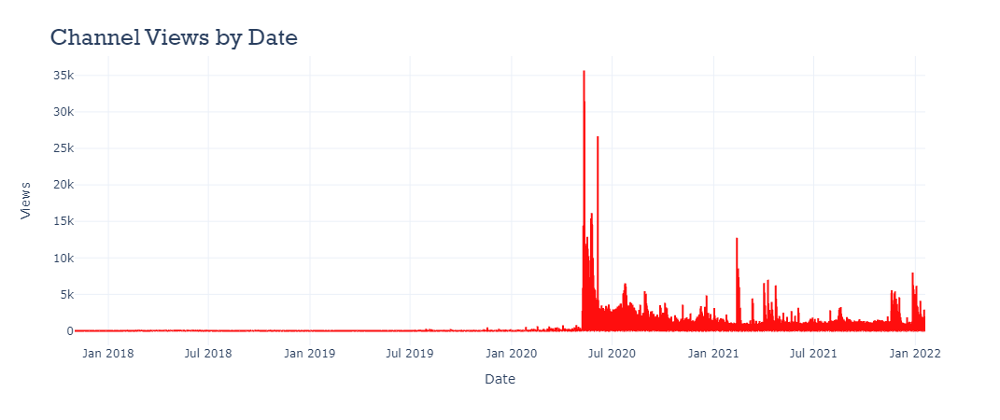

In [49]:
fig = px.line(video_perf, x='Date', y='Views')
plt_title = "Channel Views by Date"

fig.update_traces(line=dict(
                        color='rgb(255, 14, 14)'))   
fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        }
        
    )
fig.show()

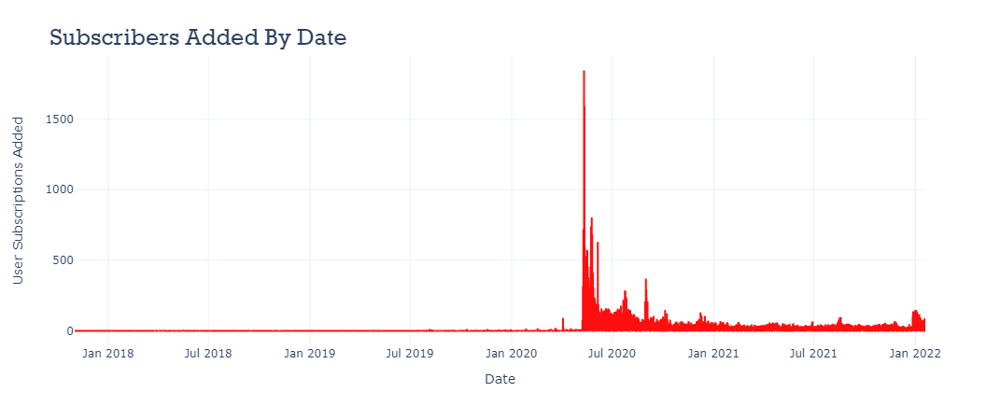

In [50]:
fig = px.line(video_perf, x='Date', y='User Subscriptions Added')
plt_title = "Subscribers Added By Date"

fig.update_traces(line=dict(
                        color='rgb(255, 14, 14)'))   
fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        }
        
    )
fig.show()

# Comments

From the description :

All Comments - This is all of my comment data gathered from the YouTube API. I have anonymized the users so don’t worry about your name showing up!

In [51]:
comments.head()

,Comments,Comment_ID,Reply_Count,Like_Count,Date,VidId,user_ID
0,Thanks for this video Ken.\n\nI decided to go ...,UgxFZTIzC4UPyhhX_PZ4AaABAg,0,0,2022-01-22T08:13:29Z,xpIFS6jZbe8,user_981
1,Hello ken jee!!! I'm doing a graduation on Com...,Ugx3IYuAufhb932GYQx4AaABAg,0,0,2022-01-22T01:09:46Z,xpIFS6jZbe8,user_213
2,"Thanks for this video, man. So useful. I'll me...",UgyhwwoK24arzRt1mud4AaABAg,0,0,2022-01-21T23:59:05Z,rEWPqw6rMGI,user_1065
3,Great video!!! I started learning Python 8 mon...,UgwrrI7nd3WClsotmHV4AaABAg,0,0,2022-01-21T23:00:37Z,xpIFS6jZbe8,user_3391
4,Been watching hours of your material (and Tina...,UgxlOrHO4MHKSwY9mUN4AaABAg,0,0,2022-01-21T20:24:20Z,sHRq-LshG3U,user_2816


In [52]:
comments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10240 entries, 0 to 10239
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Comments     10239 non-null  object
 1   Comment_ID   10240 non-null  object
 2   Reply_Count  10240 non-null  int64 
 3   Like_Count   10240 non-null  int64 
 4   Date         10240 non-null  object
 5   VidId        10240 non-null  object
 6   user_ID      10240 non-null  object
dtypes: int64(2), object(5)
memory usage: 560.1+ KB


In [53]:
comments['Comments'] = comments['Comments'].astype(str)

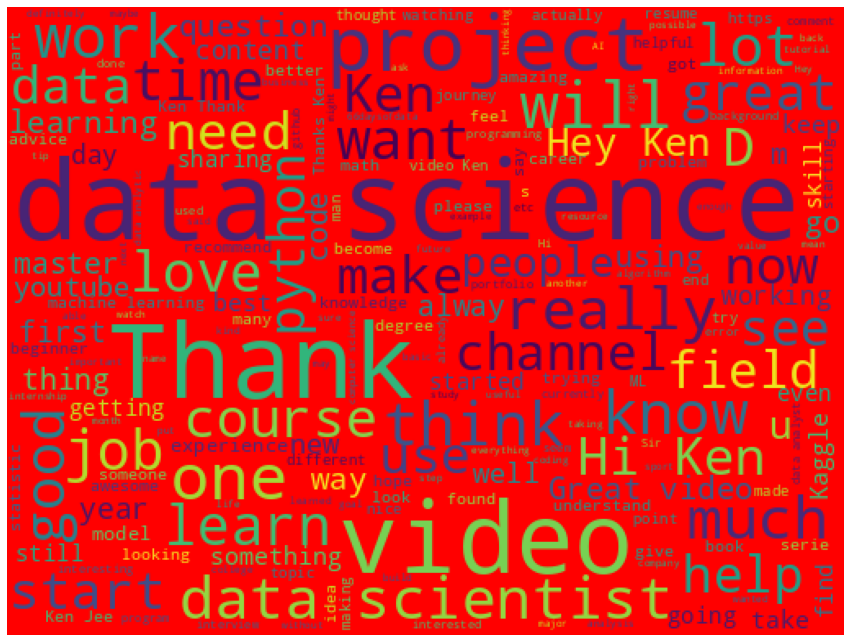

In [54]:
words = comments['Comments']
plt.subplots(figsize = (15,15))

wordcloud = WordCloud (
                    background_color = 'red',
                    width = 512,
                    height = 384
                        ).generate(' '.join(words))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.savefig('Plotly-World_Cloud.png')
plt.show()

In [55]:
comments['Date']=pd.to_datetime(comments['Date'])
comments.head()

,Comments,Comment_ID,Reply_Count,Like_Count,Date,VidId,user_ID
0,Thanks for this video Ken.\n\nI decided to go ...,UgxFZTIzC4UPyhhX_PZ4AaABAg,0,0,2022-01-22 08:13:29+00:00,xpIFS6jZbe8,user_981
1,Hello ken jee!!! I'm doing a graduation on Com...,Ugx3IYuAufhb932GYQx4AaABAg,0,0,2022-01-22 01:09:46+00:00,xpIFS6jZbe8,user_213
2,"Thanks for this video, man. So useful. I'll me...",UgyhwwoK24arzRt1mud4AaABAg,0,0,2022-01-21 23:59:05+00:00,rEWPqw6rMGI,user_1065
3,Great video!!! I started learning Python 8 mon...,UgwrrI7nd3WClsotmHV4AaABAg,0,0,2022-01-21 23:00:37+00:00,xpIFS6jZbe8,user_3391
4,Been watching hours of your material (and Tina...,UgxlOrHO4MHKSwY9mUN4AaABAg,0,0,2022-01-21 20:24:20+00:00,sHRq-LshG3U,user_2816


In [56]:
comments['Year'] = comments['Date'].dt.year
comments['Month'] = comments['Date'].dt.month

In [57]:
comments['Day'] = comments['Date'].dt.day

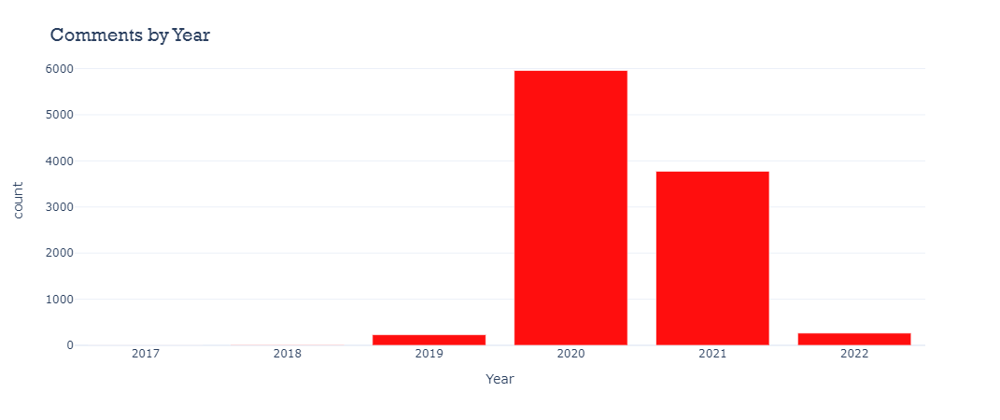

In [58]:
temp = pd.DataFrame(comments['Year'].value_counts().sort_values(ascending = True))
temp.columns = ['count'] # `count` is like a keyword name for the feature here
temp['Year'] = temp.index


plt_title = 'Comments by Year'

fig = px.bar(temp, x = 'Year', y = 'count')
fig.update_traces(marker_color='rgb(255,14,14)')
# template enhancement
fig.update_layout(
    template="plotly_white",
    title={
        "text": plt_title,
        "font": {"family": "Rockwell", "size": 20},
        "yanchor": "top",
    }
)
fig.show()

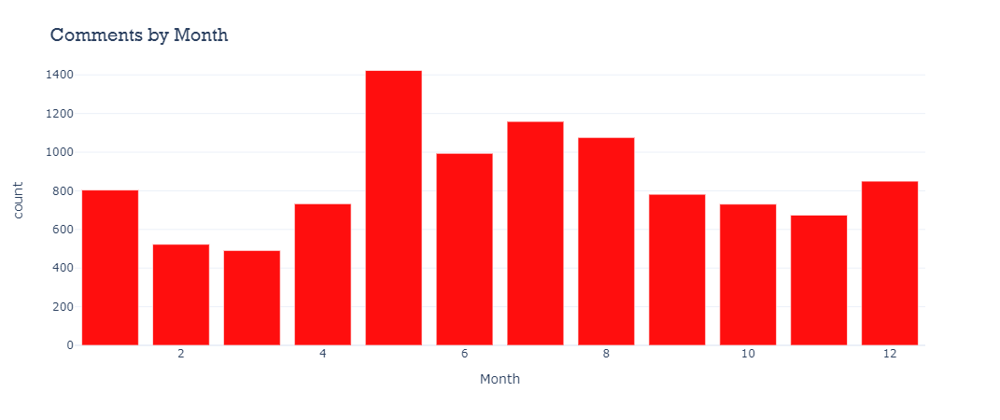

In [59]:
temp = pd.DataFrame(comments['Month'].value_counts().sort_values(ascending = True))
temp.columns = ['count'] # `count` is like a keyword name for the feature here
temp['Month'] = temp.index


plt_title = 'Comments by Month'

fig = px.bar(temp, x = 'Month', y = 'count')
fig.update_traces(marker_color='rgb(255,14,14)')
# template enhancement
fig.update_layout(
    template="plotly_white",
    title={
        "text": plt_title,
        "font": {"family": "Rockwell", "size": 20},
        "yanchor": "top",
    }
)
fig.show()

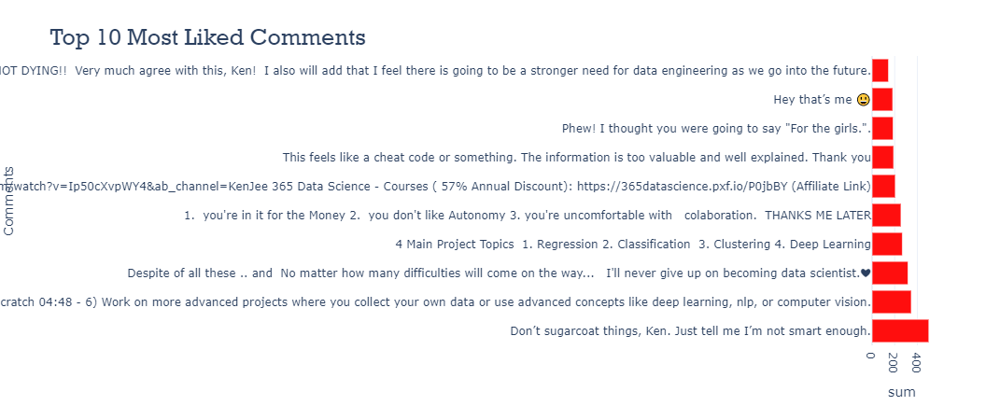

In [60]:
df1 = comments.groupby('Comments')['Like_Count'].agg(['sum']).sort_values(by = 'sum', ascending=False).reset_index().head(10)

fig = px.bar( df1, y='Comments',x = 'sum')

plt_title = "Top 10 Most Liked Comments"

fig.update_traces(marker_color='rgb(255,14,14)')    
fig.update_layout(
        template="plotly_white",
        title={
            "text": plt_title,
            "font": {"family": "Rockwell", "size": 25},
            "yanchor": "top",
        }
        
    )
fig.show()

# Sentiment Analysis

In [65]:
import nltk
from textblob import TextBlob
from sklearn import metrics
from mlxtend.plotting import plot_confusion_matrix

In [66]:
comments['polarity'] = comments['Comments'].apply(lambda x: TextBlob(x).sentiment.polarity)

In [67]:
comments.head()

,Comments,Comment_ID,Reply_Count,Like_Count,Date,VidId,user_ID,Year,Month,Day,polarity
0,Thanks for this video Ken.\n\nI decided to go ...,UgxFZTIzC4UPyhhX_PZ4AaABAg,0,0,2022-01-22 08:13:29+00:00,xpIFS6jZbe8,user_981,2022,1,22,0.191667
1,Hello ken jee!!! I'm doing a graduation on Com...,Ugx3IYuAufhb932GYQx4AaABAg,0,0,2022-01-22 01:09:46+00:00,xpIFS6jZbe8,user_213,2022,1,22,0.433333
2,"Thanks for this video, man. So useful. I'll me...",UgyhwwoK24arzRt1mud4AaABAg,0,0,2022-01-21 23:59:05+00:00,rEWPqw6rMGI,user_1065,2022,1,21,0.250000
3,Great video!!! I started learning Python 8 mon...,UgwrrI7nd3WClsotmHV4AaABAg,0,0,2022-01-21 23:00:37+00:00,xpIFS6jZbe8,user_3391,2022,1,21,0.456667
4,Been watching hours of your material (and Tina...,UgxlOrHO4MHKSwY9mUN4AaABAg,0,0,2022-01-21 20:24:20+00:00,sHRq-LshG3U,user_2816,2022,1,21,0.341667


In [68]:
comments['pol_cat']  = 0

In [70]:
comments['pol_cat'][comments.polarity > 0] = 1
comments['pol_cat'][comments.polarity <= 0] = -1

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [71]:
comments.head()

,Comments,Comment_ID,Reply_Count,Like_Count,Date,VidId,user_ID,Year,Month,Day,polarity,pol_cat
0,Thanks for this video Ken.\n\nI decided to go ...,UgxFZTIzC4UPyhhX_PZ4AaABAg,0,0,2022-01-22 08:13:29+00:00,xpIFS6jZbe8,user_981,2022,1,22,0.191667,1
1,Hello ken jee!!! I'm doing a graduation on Com...,Ugx3IYuAufhb932GYQx4AaABAg,0,0,2022-01-22 01:09:46+00:00,xpIFS6jZbe8,user_213,2022,1,22,0.433333,1
2,"Thanks for this video, man. So useful. I'll me...",UgyhwwoK24arzRt1mud4AaABAg,0,0,2022-01-21 23:59:05+00:00,rEWPqw6rMGI,user_1065,2022,1,21,0.250000,1
3,Great video!!! I started learning Python 8 mon...,UgwrrI7nd3WClsotmHV4AaABAg,0,0,2022-01-21 23:00:37+00:00,xpIFS6jZbe8,user_3391,2022,1,21,0.456667,1
4,Been watching hours of your material (and Tina...,UgxlOrHO4MHKSwY9mUN4AaABAg,0,0,2022-01-21 20:24:20+00:00,sHRq-LshG3U,user_2816,2022,1,21,0.341667,1


In [72]:
comments['pol_cat'].value_counts()

 1    7255
-1    2985
Name: pol_cat, dtype: int64

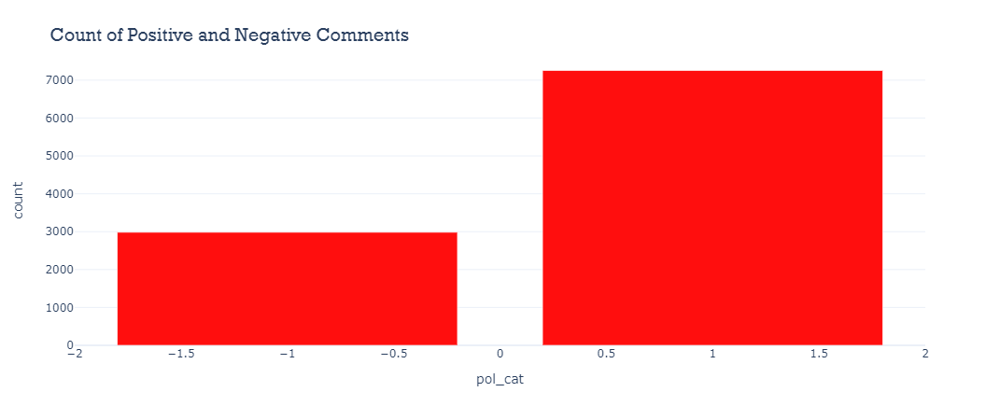

In [75]:
temp = pd.DataFrame(comments['pol_cat'].value_counts().sort_values(ascending = True))
temp.columns = ['count'] # `count` is like a keyword name for the feature here
temp['pol_cat'] = temp.index


plt_title = 'Count of Positive and Negative Comments'

fig = px.bar(temp, x = 'pol_cat', y = 'count')
fig.update_traces(marker_color='rgb(255,14,14)')
# template enhancement
fig.update_layout(
    template="plotly_white",
    title={
        "text": plt_title,
        "font": {"family": "Rockwell", "size": 20},
        "yanchor": "top",
    }
)
fig.show()

In [76]:
comments_pos = comments[comments['pol_cat'] == 1]
comments_pos = comments_pos.reset_index(drop = True)

comments_neg = comments[comments['pol_cat'] == -1]
comments_neg =comments_neg.reset_index(drop = True)

# For Model Training

In [78]:
comments['Comments'] = comments['Comments'].str.lower()

In [79]:
from nltk.corpus import stopwords
from nltk import word_tokenize
import string
import re
import nltk

In [80]:
stop_words = set(stopwords.words('english'))

In [81]:
comments['Comments'] = comments['Comments'].str.strip()

In [82]:
train = comments.copy()

In [83]:
train['Comments'] = train['Comments'].str.strip()

In [84]:
def remove_stopwords(line):
    word_tokens = word_tokenize(line)
    filtered_sentence = [w for w in word_tokens if not w in stop_words]
    return " ".join(filtered_sentence)

In [86]:
comments['stop_comments'] = comments['Comments'].apply(lambda x : remove_stopwords(x))

In [87]:
comments.head()

,Comments,Comment_ID,Reply_Count,Like_Count,Date,VidId,user_ID,Year,Month,Day,polarity,pol_cat,stop_comments
0,thanks for this video ken.\n\ni decided to go ...,UgxFZTIzC4UPyhhX_PZ4AaABAg,0,0,2022-01-22 08:13:29+00:00,xpIFS6jZbe8,user_981,2022,1,22,0.191667,1,thanks video ken . decided go tech 2018 learni...
1,hello ken jee!!! i'm doing a graduation on com...,Ugx3IYuAufhb932GYQx4AaABAg,0,0,2022-01-22 01:09:46+00:00,xpIFS6jZbe8,user_213,2022,1,22,0.433333,1,hello ken jee ! ! ! 'm graduation computer sci...
2,"thanks for this video, man. so useful. i'll me...",UgyhwwoK24arzRt1mud4AaABAg,0,0,2022-01-21 23:59:05+00:00,rEWPqw6rMGI,user_1065,2022,1,21,0.250000,1,"thanks video , man . useful . 'll meet 'm seni..."
3,great video!!! i started learning python 8 mon...,UgwrrI7nd3WClsotmHV4AaABAg,0,0,2022-01-21 23:00:37+00:00,xpIFS6jZbe8,user_3391,2022,1,21,0.456667,1,great video ! ! ! started learning python 8 mo...
4,been watching hours of your material (and tina...,UgxlOrHO4MHKSwY9mUN4AaABAg,0,0,2022-01-21 20:24:20+00:00,sHRq-LshG3U,user_2816,2022,1,21,0.341667,1,watching hours material ( tina ) know easy fie...


In [88]:
from sklearn.model_selection import train_test_split

In [89]:
X_train,X_test,y_train,y_test = train_test_split(comments['stop_comments'],comments['pol_cat'],test_size = 0.2,random_state = 324)

In [90]:
X_train.shape

(8192,)

In [91]:
X_test.shape

(2048,)

## Logistic Regression

In [93]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer 
vect = CountVectorizer()
tf_train = vect.fit_transform(X_train)
tf_test = vect.transform(X_test)

In [94]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(tf_train,y_train)

LogisticRegression()

## Accuracy Score on training data

In [95]:
lr.score(tf_train,y_train)

0.9774169921875

## Accuracy score on test data

In [96]:
lr.score(tf_test,y_test)

0.89697265625

## Making Predictions

In [98]:
expected = y_test
predicted = lr.predict(tf_test)

## Confusion Matrix

[[1343  120]
 [  91  494]]


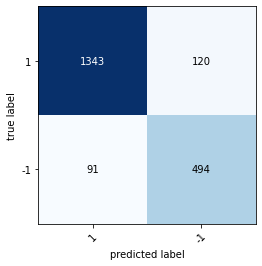

In [102]:
cf = metrics.confusion_matrix(expected,predicted,labels = [1,-1])
print(cf)


fig, ax = plot_confusion_matrix(conf_mat = cf, class_names = [1,-1])
plt.show()

In [100]:
from sklearn import metrics
print(metrics.classification_report(expected, predicted))

              precision    recall  f1-score   support

          -1       0.80      0.84      0.82       585
           1       0.94      0.92      0.93      1463

    accuracy                           0.90      2048
   macro avg       0.87      0.88      0.88      2048
weighted avg       0.90      0.90      0.90      2048



## F1 Score

In [101]:
from sklearn.metrics import f1_score
f1_score(expected, predicted, average='macro')

0.8755930252543326

**Many thanks to Ken Jee  for providing this amazing dataset.**